In [3]:

import datetime
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from autots import AutoTS
import pathlib

In [4]:
well_data = pd.read_excel('../data/Data-Wells.xlsx')
# rm_nd = well_data.loc[well_data['1,4-Dioxane Results (ppb)'] != 'nd'].copy()
# rm_capital_nd = rm_nd.loc[rm_nd['1,4-Dioxane Results (ppb)'] != 'ND'].copy()
# rm_capital_nd['1,4-Dioxane Results (ppb)'] = rm_capital_nd['1,4-Dioxane Results (ppb)'].map(lambda x: x.replace(',', ''))
# rm_capital_nd['1,4-Dioxane Results (ppb)'] = rm_capital_nd['1,4-Dioxane Results (ppb)'].map(lambda x: x.replace('<', ''))
# res = rm_capital_nd
# res.loc[:, 'ds']= pd.to_datetime(res['Date Sampled'])
# res.loc[:, 'dioxane_results']= pd.to_numeric(res['1,4-Dioxane Results (ppb)'])
filtered = well_data.iloc[:, lambda df: df.columns.str.contains('Well Name|Aquifer|LONG|LAT|Genl Bot Scr Elev',
                                              case=False)].copy()
filtered.head(20)

,Well Name,Aquifer,AQUIFER2,LONG,LAT,Genl Bot Scr Elev
0,1021 Westview Way,Not Determined,other,0.000000,0.000000,NaN
1,1024 Westview Way,Not Determined,other,0.000000,0.000000,NaN
2,1049 Westview Way,Not Determined,other,0.000000,0.000000,NaN
3,105 Myrtle,D0,D0,-83.827509,42.285461,817.00
4,105 Myrtle,D0,D0,-83.827509,42.285461,817.00
5,105 Myrtle,D0,D0,-83.827509,42.285461,817.00
6,105 Myrtle,D0,D0,-83.827509,42.285461,817.00
7,105 Myrtle,D0,D0,-83.827509,42.285461,817.00
8,105 Myrtle,D0,D0,-83.827509,42.285461,817.00
9,105 Myrtle,D0,D0,-83.827509,42.285461,817.00


In [5]:
dedup = filtered.drop_duplicates()
dedup

,Well Name,Aquifer,AQUIFER2,LONG,LAT,Genl Bot Scr Elev
0,1021 Westview Way,Not Determined,other,0.000000,0.000000,NaN
1,1024 Westview Way,Not Determined,other,0.000000,0.000000,NaN
2,1049 Westview Way,Not Determined,other,0.000000,0.000000,NaN
3,105 Myrtle,D0,D0,-83.827509,42.285461,817.0
14,1052 Westview Way,Not Determined,other,0.000000,0.000000,NaN
...,...,...,...,...,...,...
34125,TW-9,D2,D2,-83.806538,42.280146,810.0
34353,Varsity Ford,D2,D2,-83.798543,42.285901,NaN
34359,Weber's Drain 1st Sister Lake,Not Applicable,other,0.000000,0.000000,NaN
34362,Weber's Heat Pump Drain,Not Applicable,other,0.000000,0.000000,NaN


In [6]:
class Well:
     def __init__(self, name, aquifer, long, lat, src_ele):
        self.name = name
        self.aquifer = aquifer
        self.long = long
        self.lat = lat
        self.src_ele = src_ele

     def __repr__(self):
        return self.name + ',' +self.aquifer + ',' + str(self.long) +','+str(self.lat) + ','+ str(self.src_ele)

In [7]:
wells = {}
for index, row in dedup.iterrows():
    name = row[0]
    aquifer = row[1]
    long = pd.to_numeric(row[3], errors='coerce')
    lat = pd.to_numeric(row[4], errors='coerce')
    src_ele = pd.to_numeric(row[5], errors='coerce')
    row[3] = long
    row[4] = lat
    row[5] = src_ele
    wells[name] = Well(name, aquifer, long, lat, src_ele)

In [8]:
cache_dir = pathlib.Path('../cache/')

def get_data(well_name):
    well_name_dir = cache_dir.joinpath(well_name)
    if not well_name_dir.exists(): return None
    ori = pd.read_csv(well_name_dir.joinpath('data.csv'), parse_dates= ['Date'], index_col = 0, squeeze = True)
    predict = pd.read_csv(well_name_dir.joinpath('predict.csv'), parse_dates= ['Date'],index_col = 0, squeeze = True)
    return ori, predict

In [9]:
copy_dedup = dedup

In [10]:
dedup.loc[:, 'LONG']= pd.to_numeric(dedup['LONG'], errors='coerce')
dedup.loc[:, 'LAT']= pd.to_numeric(dedup['LAT'], errors='coerce')
dedup.loc[:, 'Genl Bot Scr Elev']= pd.to_numeric(dedup['Genl Bot Scr Elev'], errors='coerce')

/Users/zhangziliang/.virtualenvs/Gelman-Plume-Analysis/lib/python3.7/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [11]:
dedup


,Well Name,Aquifer,AQUIFER2,LONG,LAT,Genl Bot Scr Elev
0,1021 Westview Way,Not Determined,other,0.000000,0.000000,NaN
1,1024 Westview Way,Not Determined,other,0.000000,0.000000,NaN
2,1049 Westview Way,Not Determined,other,0.000000,0.000000,NaN
3,105 Myrtle,D0,D0,-83.827509,42.285461,817.0
14,1052 Westview Way,Not Determined,other,0.000000,0.000000,NaN
...,...,...,...,...,...,...
34125,TW-9,D2,D2,-83.806538,42.280146,810.0
34353,Varsity Ford,D2,D2,-83.798543,42.285901,NaN
34359,Weber's Drain 1st Sister Lake,Not Applicable,other,0.000000,0.000000,NaN
34362,Weber's Heat Pump Drain,Not Applicable,other,0.000000,0.000000,NaN


## by Aquifer

B2
C2
C3
D0
D2
E
Marshy
Not Applicable
Not Determined
SH
SW
Surface Water


/Users/zhangziliang/.virtualenvs/Gelman-Plume-Analysis/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


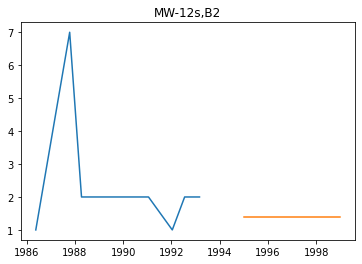

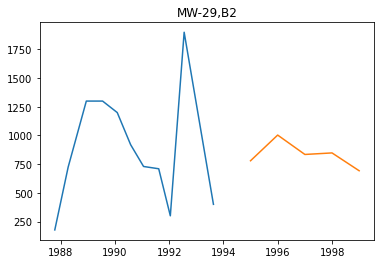

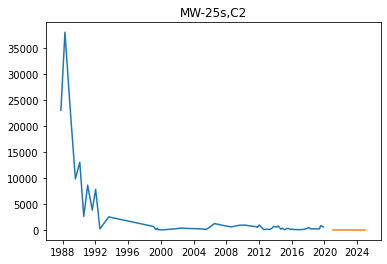

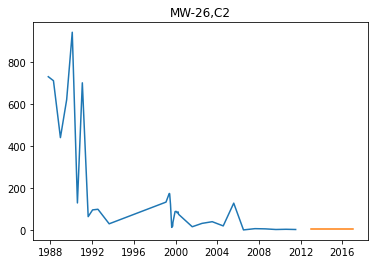

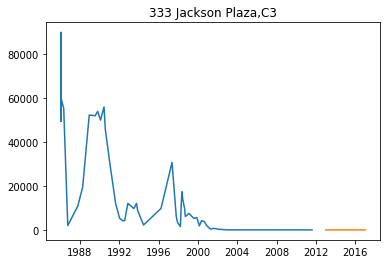

...

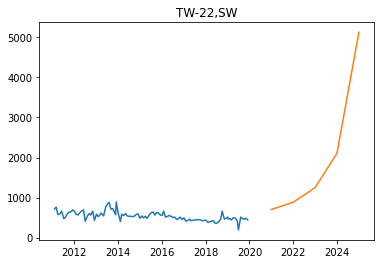

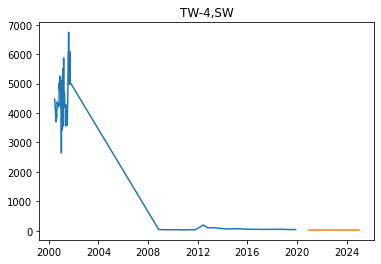

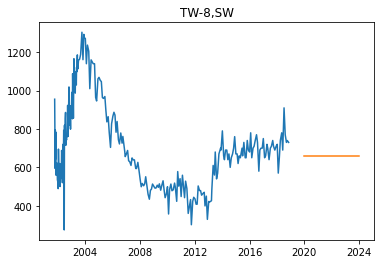

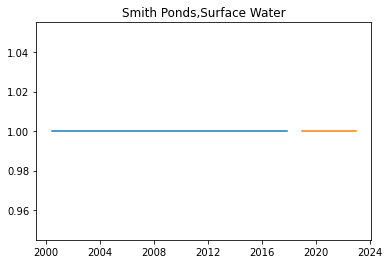

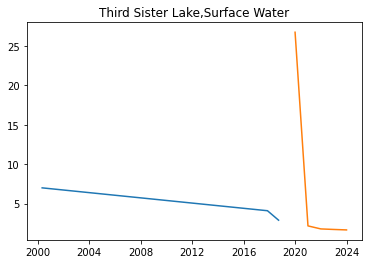

In [12]:
grouped = dedup.groupby('Aquifer')
for ac, group in grouped:

    print(ac)
    for index, row in group.iterrows():
        well_name_i = row['Well Name']
        data_i = get_data(well_name_i)
        if data_i is None : continue
        fig_, ax_ = plt.subplots()
        ax_.set_title(well_name_i+ ',' + ac)
        ax_.plot(data_i[0],  label='a')
        ax_.plot(data_i[1],  label='b')

## by Genl Bot Scr Elev

0.0
655.08
664.99
666.52
669.0
671.43
672.5
673.88
675.3
675.63
677.36
680.14
684.7
691.49
691.97
692.06
694.31
695.11
695.57
698.37
698.89
699.55
700.93
701.85
702.52
703.08
703.38
706.95
709.52
709.85
711.65
711.72
712.22
712.52
713.0
713.48
714.33
714.85
715.04
715.11
717.87
718.02
718.07
719.52
720.01
721.9
722.75
725.37
726.0
727.88
728.64
728.94
729.91
730.82
731.0
731.11
732.58
733.89
735.0
735.28
738.87
739.19
740.3
741.54
741.95
742.49
743.22
743.47
744.0
745.66
746.92
747.52
749.33
750.54
753.37
754.13
754.65
755.11
755.38
755.74
757.83
758.88
759.03
759.57
760.0
761.26
762.15
762.34
763.04
764.36
764.92
766.12
767.37
769.54
770.76
772.18
772.98
773.0
773.52
775.02
777.02
777.2
780.69
780.98
781.42
781.44
785.59
786.44
786.8
786.92
787.0
787.34
788.11
788.69
789.0
789.34
789.36
790.56
791.14
791.85
791.86
792.0
792.42
794.33
795.9
796.02
796.9
797.06
797.96
798.5
800.33
800.89
804.22
804.42
804.45
805.53
805.63
806.22
806.57
807.04
807.41
809.57
810.0
810.22
815.18
815.57
816

/Users/zhangziliang/.virtualenvs/Gelman-Plume-Analysis/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


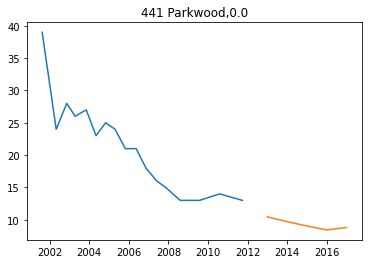

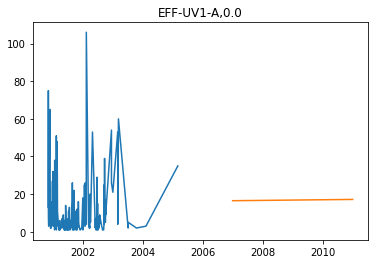

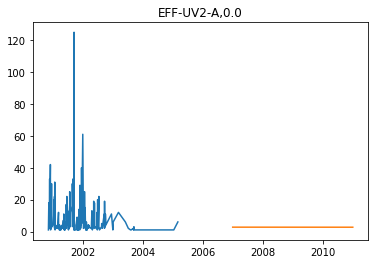

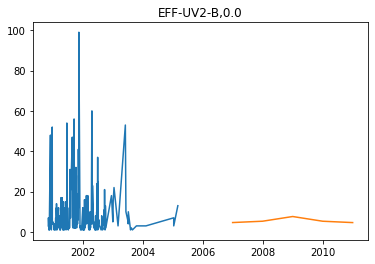

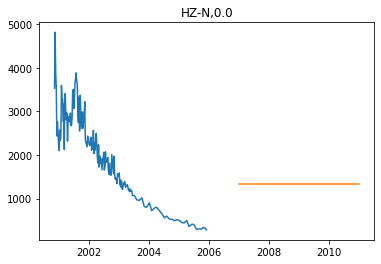

...

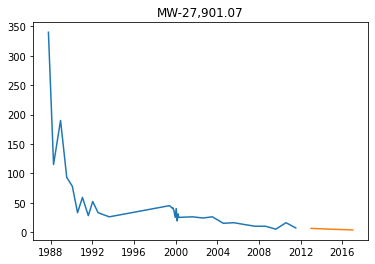

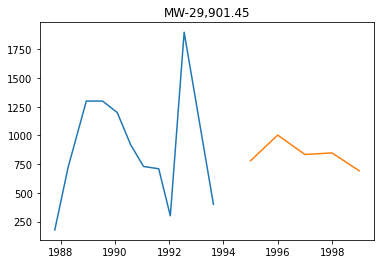

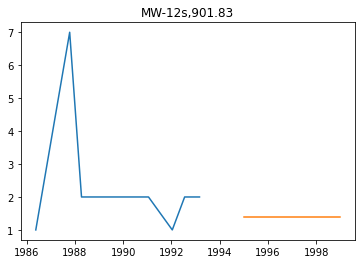

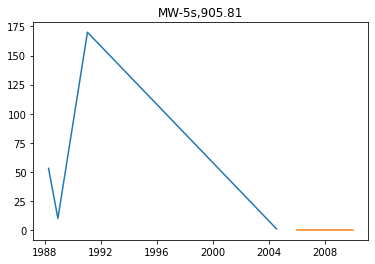

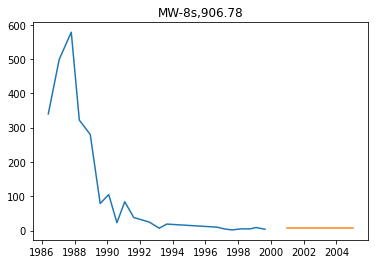

In [14]:

grouped = dedup.groupby('Genl Bot Scr Elev')
for ac, group in grouped:

    print(ac)
    for index, row in group.iterrows():
        well_name_i = row['Well Name']
        data_i = get_data(well_name_i)
        if data_i is None : continue
        fig_, ax_ = plt.subplots()
        ax_.set_title(well_name_i+ ',' + str(ac))
        ax_.plot(data_i[0],  label='a')
        ax_.plot(data_i[1],  label='b')

## By Distance

In [17]:
add_loc = dedup

pollution_src = (-83.801700, 42.276340)
def haversine(Olat,Olon, Dlat,Dlon):

    radius = 6371.  # km

    d_lat = np.radians(Dlat - Olat)
    d_lon = np.radians(Dlon - Olon)
    a = (np.sin(d_lat / 2.) * np.sin(d_lat / 2.) +
         np.cos(np.radians(Olat)) * np.cos(np.radians(Dlat)) *
         np.sin(d_lon / 2.) * np.sin(d_lon / 2.))
    c = 2. * np.arctan2(np.sqrt(a), np.sqrt(1. - a))
    d = radius * c
    return d

def f(row):
    if row['LAT'] == 0 or row['LONG'] == 0 :
        return None
    val = haversine(row['LAT'], row['LONG'], pollution_src[1],pollution_src[0])
    return val
add_loc.loc[:, 'distance']= add_loc.apply(f, axis = 1)
add_loc.head(20)

/Users/zhangziliang/.virtualenvs/Gelman-Plume-Analysis/lib/python3.7/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


,Well Name,Aquifer,AQUIFER2,LONG,LAT,Genl Bot Scr Elev,distance
0,1021 Westview Way,Not Determined,other,0.000000,0.000000,NaN,NaN
1,1024 Westview Way,Not Determined,other,0.000000,0.000000,NaN,NaN
2,1049 Westview Way,Not Determined,other,0.000000,0.000000,NaN,NaN
3,105 Myrtle,D0,D0,-83.827509,42.285461,817.00,2.353044
14,1052 Westview Way,Not Determined,other,0.000000,0.000000,NaN,NaN
15,1080 Westview Way,Not Determined,other,0.000000,0.000000,NaN,NaN
16,110 Parkland Plaza,D0,D0,-83.814302,42.283187,841.68,1.286284
70,1105 Westview Way,Not Determined,other,0.000000,0.000000,NaN,NaN
71,1108 Westview Way,Not Determined,other,0.000000,0.000000,NaN,NaN
72,1130 Westview Way,Not Determined,other,0.000000,0.000000,NaN,NaN


/Users/zhangziliang/.virtualenvs/Gelman-Plume-Analysis/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


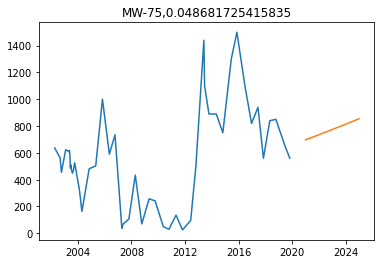

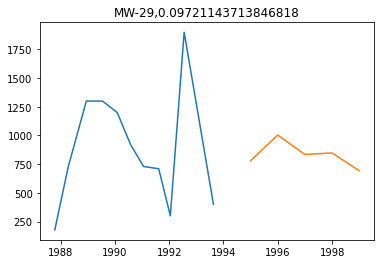

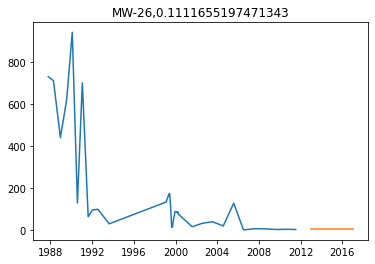

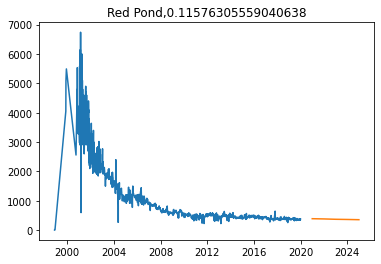

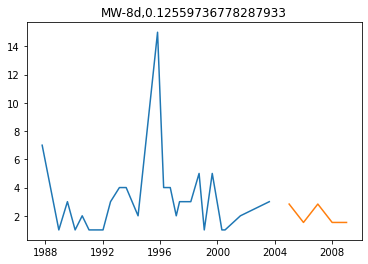

...

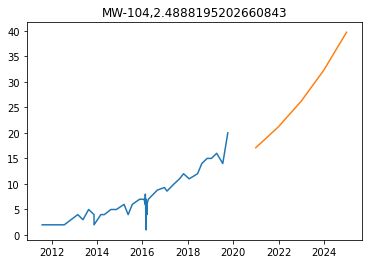

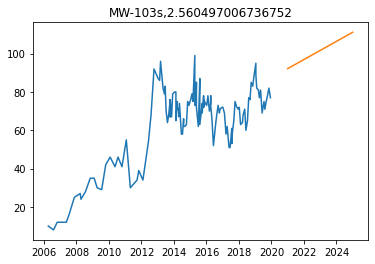

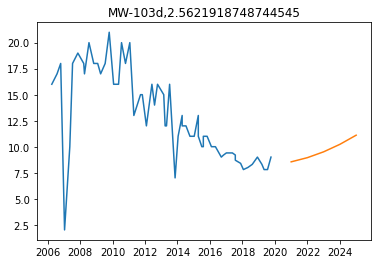

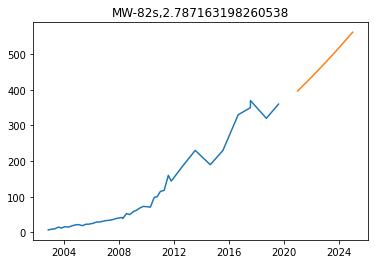

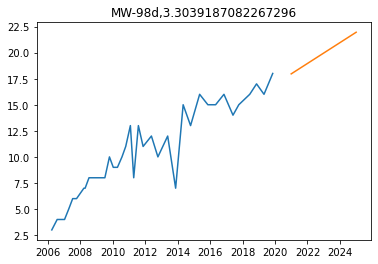

In [18]:
grouped = add_loc.groupby('distance')
for ac, group in grouped:

    # print(ac)
    for index, row in group.iterrows():
        well_name_i = row['Well Name']
        data_i = get_data(well_name_i)
        if data_i is None : continue
        fig_, ax_ = plt.subplots()
        ax_.set_title(well_name_i+ ',' + str(ac))
        ax_.plot(data_i[0],  label='a')
        ax_.plot(data_i[1],  label='b')